In [10]:
import pandas as pd
import time
df = pd.read_csv('cornell_rich_speaker.csv')

In [7]:
# Number of speakers
print("Number of speakers:", len(df))

Number of speakers: 863


In [8]:
df.head()


,name,movie_title,number_of_lines,age_bracket,profession,religion,country_of_origin,additional_info,quote,annotated,speaker_id,movie_id,gender,description,source
0,alvy,annie hall,500,Adult,Comedian,Jewish,USA,The film is from his perspective and introspec...,"You know, I-I keep sifting the pieces of the ...",True,u3681,m243,A man,Comedian Alvy Singer is trying to understand w...,https://en.wikipedia.org/wiki/Annie_Hall
1,harold,harold and maude,244,Young Adult,Student,Unknown,USA,NaN,...I go to funerals.,True,u1272,m84,A man,Harold Chasen is a 19-year-old man obsessed wi...,https://en.wikipedia.org/wiki/Harold_and_Maude
2,terry,on the waterfront,225,Adult,Dock Worker,Troubled Catholic,USA,Played by Marlon Brando.,“You wanna hear my philosophy on life? Do it t...,True,u6967,m465,A man,He managed to keep his hopes up for something ...,https://hero.fandom.com/wiki/Terry_Malloy
3,weir,event horizon,104,Adult,Starship Designer,Unknown,USA,The film is set in 2047.,A dimension of pure chaos. Pure... evil. When ...,True,u888,m57,A man,Dr William Weir briefs the rescuers on the shi...,https://en.wikipedia.org/wiki/Event_Horizon_(f...
4,duke,fear and loathing in las vegas,179,Adult,Journalist,Unknown,USA,NaN,A drug person can learn to cope with things li...,True,u920,m60,A man,"He is portrayed as a cynical, mentally unbalan...",https://en.wikipedia.org/wiki/Raoul_Duke


In [29]:
import requests
import configparser

config = configparser.ConfigParser()
config.read('config.ini')
API_KEY = config['TMDB']['API_KEY']

BASE_URL = "https://api.themoviedb.org/3"

def get_actor(movie_title, character_name):
    # Search for the movie
    search_url = f"{BASE_URL}/search/movie"
    response = requests.get(search_url, params={"api_key": API_KEY, "query": movie_title})
    results = response.json().get("results", [])
    if not results:
        return None

    # Get movie ID and fetch credits
    movie_id = results[0]["id"]
    credits_url = f"{BASE_URL}/movie/{movie_id}/credits"
    response = requests.get(credits_url, params={"api_key": API_KEY})
    cast = response.json().get("cast", [])

    # Match character name
    for person in cast:
        if character_name.lower() in person["character"].lower():
            return person["name"]
    return None

# Example usage
actor_name = get_actor("murderland", "matthew")
print(actor_name)


None


In [11]:
# Add a column for actor names
actor_names = []
for index, row in df.iterrows():
    actor_name = get_actor(row["movie_title"], row["name"])
    actor_names.append(actor_name)
    
    # Respect API limit of 50 requests per second
    time.sleep(0.04)  # Sleep for 20 milliseconds between requests

df["actor_name"] = actor_names

# Save or display the updated DataFrame
print(df)
df.to_csv("movie_actors_with_names.csv", index=False)

        name                     movie_title  number_of_lines  age_bracket  \
0       alvy                      annie hall              500        Adult   
1     harold                harold and maude              244  Young Adult   
2      terry               on the waterfront              225        Adult   
3       weir                   event horizon              104        Adult   
4       duke  fear and loathing in las vegas              179        Adult   
..       ...                             ...              ...          ...   
858    brody                            jaws              166        Adult   
859   galvin                         verdict              280        Adult   
860    miles             intolerable cruelty              248        Adult   
861  micheal                 very bad things               77        Adult   
862     john        sex, lies, and videotape              106        Adult   

            profession           religion country_of_origin  \


In [13]:
df["actor_name"].value_counts()


actor_name
Tom Cruise           7
Robert De Niro       7
Nicolas Cage         7
Dustin Hoffman       6
Tom Hanks            6
                    ..
Michael Murphy       1
Thora Birch          1
Joanne Whalley       1
Haley Joel Osment    1
Peter Gallagher      1
Name: count, Length: 572, dtype: int64

In [14]:
import kagglehub
import pandas as pd
import os
import numpy as np
import ast

path = kagglehub.dataset_download("rajathmc/cornell-moviedialog-corpus")
print("Path to dataset files:", path)

# Calculate total size of data
total_size = 0
for filename in os.listdir(path):
    if filename.endswith('.txt'):
        file_size = os.path.getsize(os.path.join(path, filename))
        total_size += file_size
print(f"Total size of data: {total_size / (1024 * 1024):.2f} MB")

# Load the datasets
movie_lines = pd.read_csv(f"{path}/movie_lines.txt", sep=r' \+\+\+\$\+\+\+ ', header=None,
                          on_bad_lines='skip', encoding='ISO-8859-1', engine='python')

# Load the movie titles metadata
movie_titles = pd.read_csv(f"{path}/movie_titles_metadata.txt", sep=r' \+\+\+\$\+\+\+ ', 
                          header=None, encoding='ISO-8859-1', engine='python',
                          names=['MovieID', 'Title', 'Year', 'Rating', 'Votes', 'Genres'])

# Rename columns
movie_lines.columns = ['LineID', 'CharacterID', 'MovieID', 'CharacterName', 'Text']

# Load the movie conversations
movie_conversations = pd.read_csv(f"{path}/movie_conversations.txt", sep=r' \+\+\+\$\+\+\+ ', header=None,
                                  on_bad_lines='skip', encoding='ISO-8859-1', engine='python')

# Rename columns
movie_conversations.columns = ['CharacterID1', 'CharacterID2', 'MovieID', 'Conversation']

# Strip whitespace from CharacterIDs in both datasets
movie_lines['CharacterID'] = movie_lines['CharacterID'].str.strip()
movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].str.strip()
movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].str.strip()

# Convert to string if necessary
movie_lines['CharacterID'] = movie_lines['CharacterID'].astype(str)
movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].astype(str)
movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].astype(str)

# Create dictionaries for quick lookups
character_names = dict(zip(movie_lines['CharacterID'], movie_lines['CharacterName']))
character_movies = dict(zip(movie_lines['CharacterID'], movie_lines['MovieID']))
movie_titles_dict = dict(zip(movie_titles['MovieID'], movie_titles['Title']))

Path to dataset files: C:\Users\jbhan\.cache\kagglehub\datasets\rajathmc\cornell-moviedialog-corpus\versions\1
Total size of data: 40.28 MB


In [15]:
print(len(character_names), len(character_movies), len(movie_titles_dict))

9035 9035 617


In [16]:
# Create lists to populate the DataFrame
character_ids = []
character_names_list = []
movie_ids = []
movie_titles = []

# Populate the lists by iterating over the character_names dictionary
for character_id, character_name in character_names.items():
    # Get the movie ID for the character
    movie_id = character_movies.get(character_id, None)
    
    # Get the movie title for the movie ID
    movie_title = movie_titles_dict.get(movie_id, None)
    
    # Append the data to the lists
    character_ids.append(character_id)
    character_names_list.append(character_name)
    movie_ids.append(movie_id)
    movie_titles.append(movie_title)

# Create the DataFrame
df = pd.DataFrame({
    "CharacterID": character_ids,
    "CharacterName": character_names_list,
    "MovieID": movie_ids,
    "MovieTitle": movie_titles
})

# Display the DataFrame
print(df)

     CharacterID CharacterName MovieID                  MovieTitle
0             u0        BIANCA      m0  10 things i hate about you
1             u2       CAMERON      m0  10 things i hate about you
2             u3      CHASTITY      m0  10 things i hate about you
3             u4          JOEY      m0  10 things i hate about you
4             u5           KAT      m0  10 things i hate about you
...          ...           ...     ...                         ...
9030       u9029      CREALOCK    m616                   zulu dawn
9031       u9033  STUART SMITH    m616                   zulu dawn
9032       u9028       COGHILL    m616                   zulu dawn
9033       u9031       MELVILL    m616                   zulu dawn
9034       u9034       VEREKER    m616                   zulu dawn

[9035 rows x 4 columns]


In [57]:
from tqdm import tqdm

# Function to fetch movie cast
def get_movie_cast(movie_title):
    try:
        # Search for the movie
        search_url = f"{BASE_URL}/search/movie"
        response = requests.get(search_url, params={"api_key": API_KEY, "query": movie_title})
        results = response.json().get("results", [])
        if not results:
            return None

        # Get movie ID and fetch credits
        movie_id = results[0]["id"]
        credits_url = f"{BASE_URL}/movie/{movie_id}/credits"
        response = requests.get(credits_url, params={"api_key": API_KEY})
        cast = response.json().get("cast", [])
        return cast  # List of dictionaries with cast details
    except Exception as e:
        print(f"Error fetching cast for {movie_title}: {e}")
        return None

# Group characters by movie
movies = df.groupby("MovieTitle")["CharacterName"].apply(list).to_dict()

def extract_movie_cast(movie_title, cornell_characters):
    # Handle NaN or None values in movie title
    if pd.isna(movie_title) or movie_title is None:
        return []
    
    clean_title = str(movie_title).strip('"')
    movie_chars = cornell_characters.get(clean_title, [])
    
    # Handle NaN values in character names
    movie_chars = [str(char).lower() for char in movie_chars if pd.notna(char)]
    
    cast = get_movie_cast(clean_title)
    if cast:
        cast_info = []
        matched_cornell_chars = set()
        
        # First pass: exact matches and main character names
        for person in cast:
            char_name = person['character'].lower()
            main_char_name = char_name.split('(')[0].split("'s")[0].strip()
            
            # Try exact match first
            matched = False
            for cornell_char in movie_chars:
                if cornell_char not in matched_cornell_chars and (
                    cornell_char == char_name or 
                    cornell_char == main_char_name or
                    cornell_char in main_char_name.split()
                ):
                    matched = True
                    matched_cornell_chars.add(cornell_char)
                    cast_info.append({
                        'movie_title': clean_title,
                        'character_name': person['character'],
                        'cornell_character': cornell_char.upper(),
                        'actor_name': person['name'],
                        'cast_order': person['order'],
                        'actor_id': person['id']
                    })
                    break
        
        return cast_info
    return []

def create_cast_dataframe(movies_dict, sample_size=None):
    all_cast = []
    
    # Take a sample if specified
    movie_titles = list(movies_dict.keys())
    if sample_size:
        movie_titles = movie_titles[:sample_size]
    
    # Filter out NaN values from movie titles
    movie_titles = [title for title in movie_titles if pd.notna(title)]
    
    # Add tqdm progress bar
    for movie_title in tqdm(movie_titles, desc="Processing movies"):
        try:
            cast_info = extract_movie_cast(movie_title, movies_dict)
            if cast_info:  # Only extend if we got valid cast info
                all_cast.extend(cast_info)
            
            # Respect API limits
            time.sleep(0.1)
        except Exception as e:
            print(f"Error processing movie '{movie_title}': {str(e)}")
            continue
    
    # Create DataFrame from all cast information
    cast_df = pd.DataFrame(all_cast) if all_cast else pd.DataFrame()
    return cast_df

sample_size = None
cast_df = create_cast_dataframe(movies, sample_size)

# Display the results
print("\nCast DataFrame:")
print(cast_df)

# Save to CSV if needed
cast_df.to_csv("movie_casts_sample.csv", index=False)


Processing movies: 100%|██████████| 617/617 [02:14<00:00,  4.58it/s]


Cast DataFrame:
                     movie_title    character_name cornell_character  \
0     10 things i hate about you    Patrick Verona           PATRICK   
1     10 things i hate about you     Cameron James           CAMERON   
2     10 things i hate about you  Bianca Stratford            BIANCA   
3     10 things i hate about you    Michael Eckman           MICHAEL   
4     10 things i hate about you       Joey Donner              JOEY   
...                          ...               ...               ...   
5768                   zulu dawn    QSM Bloomfield        BLOOMFIELD   
5769                   zulu dawn       Lt. Melvill           MELVILL   
5770                   zulu dawn       Lt. Coghill           COGHILL   
5771                   zulu dawn   Lord Chelmsford        CHELMSFORD   
5772                   zulu dawn     Col. Crealock          CREALOCK   

                actor_name  cast_order  actor_id  
0             Heath Ledger           0      1810  
1     Joseph Gor

In [53]:
# Check number of characters in Cornell dataset for a specific movie
cornell_chars = df[df['MovieTitle'] == '10 things i hate about you']['CharacterName'].nunique()
print(f"Cornell characters: {cornell_chars}")

# Check number of cast members from TMDB API for the same movie
tmdb_chars = cast_df[cast_df['movie_title'] == '10 things i hate about you'].shape[0]
print(f"TMDB cast members: {tmdb_chars}")

Cornell characters: 12
TMDB cast members: 8


In [54]:
# Function to analyze mismatches for a movie
def analyze_mismatches(movie_title, df, cast_df):
    # Get Cornell characters
    cornell_chars = set(df[df['MovieTitle'] == movie_title]['CharacterName'].str.lower())
    
    # Get TMDB matched characters
    tmdb_chars = set(cast_df[cast_df['movie_title'] == movie_title]['cornell_character'].str.lower())
    
    # Find missing characters
    missing_chars = cornell_chars - tmdb_chars
    
    print(f"\nAnalysis for: {movie_title}")
    print(f"Cornell characters: {len(cornell_chars)}")
    print(f"TMDB matched characters: {len(tmdb_chars)}")
    print(f"Missing characters: {len(missing_chars)}")
    if missing_chars:
        print("Characters not found in TMDB:")
        for char in missing_chars:
            print(f"- {char}")
    print("-" * 50)

# Analyze each movie in our sample
sample_movies = cast_df['movie_title'].unique()
for movie in sample_movies:
    analyze_mismatches(movie, df, cast_df)


Analysis for: 10 things i hate about you
Cornell characters: 12
TMDB matched characters: 8
Missing characters: 4
Characters not found in TMDB:
- miss perky
- sharon
- bruce
- kat
--------------------------------------------------

Analysis for: 1492: conquest of paradise
Cornell characters: 14
TMDB matched characters: 9
Missing characters: 5
Characters not found in TMDB:
- arojaz
- pinzon
- sailor
- isabel
- utapan
--------------------------------------------------

Analysis for: 15 minutes
Cornell characters: 23
TMDB matched characters: 19
Missing characters: 4
Characters not found in TMDB:
- max
- immigration officer
- secondary officer
- robert hawkins
--------------------------------------------------

Analysis for: 2001: a space odyssey
Cornell characters: 13
TMDB matched characters: 8
Missing characters: 5
Characters not found in TMDB:
- pilot
- co-pilot
- b20
- c12
- child
--------------------------------------------------


In [55]:
def verify_tmdb_characters(movie_title):
    print(f"\nVerifying TMDB cast for: {movie_title}")
    
    # Get full cast from TMDB
    cast = get_movie_cast(movie_title)
    if cast:
        # Print all character names from TMDB
        print("\nAll TMDB characters:")
        for person in cast:
            print(f"- {person['character']}")
            
        # Get Cornell characters for this movie
        cornell_chars = set(df[df['MovieTitle'] == movie_title]['CharacterName'].str.lower())
        print("\nCornell characters not found in any form:")
        
        # Check each Cornell character
        for cornell_char in cornell_chars:
            # Check if character exists in any form in TMDB cast
            found = False
            for person in cast:
                tmdb_char = person['character'].lower()
                if (cornell_char in tmdb_char or 
                    tmdb_char in cornell_char or 
                    any(word in tmdb_char.split() for word in cornell_char.split())):
                    found = True
                    break
            
            if not found:
                print(f"- {cornell_char}")
    else:
        print("No cast found in TMDB")
    print("-" * 50)

# Verify specific movies
movies_to_verify = [
    '10 things i hate about you',
    '1492: conquest of paradise',
    '15 minutes',
    '2001: a space odyssey'
]

for movie in movies_to_verify:
    verify_tmdb_characters(movie)


Verifying TMDB cast for: 10 things i hate about you

All TMDB characters:
- Patrick Verona
- Katarina Stratford
- Cameron James
- Bianca Stratford
- Michael Eckman
- Joey Donner
- Mandella
- Chastity
- Walter Stratford
- Mr. Morgan
- Ms. Perky
- Mr. Chapin
- Scruvy
- Bogey Lowenstien
- Derek
- Trevor
- Audio Visual Guy
- Beautiful Jock
- Coffee Kid
- Coffee Kid
- Cohort
- Coffee Girl
- Drugged Out Loser
- Wimpy Loser
- Laughing Loser
- Crying Loser
- Screaming Loser
- Detention Student
- Bartender
- Drunken Girl
- Jock
- MBA Guy at Party
- Heather
- Clem
- Cowboy
- Kissing Guy
- Judith
- Perky Girl
- Buckaroo Bartender
- Biker
- Save Ferris Singer
- Save Ferris Singer
- Letters To Cleo Singer
- Letters To Cleo Singer

Cornell characters not found in any form:
- sharon
- bruce
--------------------------------------------------

Verifying TMDB cast for: 1492: conquest of paradise

All TMDB characters:
- Christopher Columbus
- Sanchez
- Queen Isabella
- Older Fernando
- Beatrix
- Marchen

In [58]:
# How many unique actors are in the cast_df?
len(cast_df["actor_name"].unique())


4237

In [60]:
# Which actors play the most characters?
cast_df["actor_name"].value_counts()

actor_name
Nicolas Cage           10
Samuel L. Jackson      10
Tom Cruise              8
Harvey Keitel           8
Robert De Niro          8
                       ..
Serena Scott Thomas     1
Kathryn Joosten         1
Art LaFleur             1
Ransford Doherty        1
Michael Jayston         1
Name: count, Length: 4237, dtype: int64

In [63]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from collections import defaultdict

# Create a function to build and analyze the network
def create_actor_movie_network(cast_df):
    # Create a bipartite graph
    G = nx.Graph()
    
    # Add movie nodes and actor nodes
    movies = cast_df['movie_title'].unique()
    actors = cast_df['actor_name'].unique()
    
    # Add nodes with different types
    G.add_nodes_from(movies, bipartite=0, node_type='movie')  # Movies are type 0
    G.add_nodes_from(actors, bipartite=1, node_type='actor')  # Actors are type 1
    
    # Add edges between movies and actors
    for _, row in cast_df.iterrows():
        G.add_edge(row['movie_title'], row['actor_name'])
    
    return G

import networkx as nx
import matplotlib.pyplot as plt

def plot_movie_network(cast_df, min_collaborations=2):
    # Create a movie-movie network where edges represent shared actors
    G = nx.Graph()
    
    # Create a dictionary of movies and their actors
    movie_actors = {}
    for movie in cast_df['movie_title'].unique():
        actors = set(cast_df[cast_df['movie_title'] == movie]['actor_name'])
        movie_actors[movie] = actors
    
    # Add edges between movies that share actors
    movies = list(movie_actors.keys())
    for i in range(len(movies)):
        for j in range(i+1, len(movies)):
            movie1, movie2 = movies[i], movies[j]
            shared_actors = len(movie_actors[movie1].intersection(movie_actors[movie2]))
            if shared_actors >= min_collaborations:
                G.add_edge(movie1, movie2, weight=shared_actors)
    
    # Set up the plot
    plt.figure(figsize=(20, 20))
    
    # Use spring layout with adjusted parameters
    pos = nx.spring_layout(G, k=2, iterations=50)
    
    # Draw the network
    nx.draw_networkx_nodes(G, pos, node_color='lightblue', 
                          node_size=2000, alpha=0.7)
    
    # Draw edges with width based on number of shared actors
    edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
    nx.draw_networkx_edges(G, pos, alpha=0.4, 
                          width=[w/2 for w in edge_weights])
    
    # Add labels with smaller font
    nx.draw_networkx_labels(G, pos, font_size=8)
    
    plt.title("Movie Network (connected by shared actors)\nEdge width represents number of shared actors", 
              pad=20, fontsize=14)
    plt.axis('off')
    
    return plt

# Alternative visualization focusing on most connected movies
def plot_top_movie_network(cast_df, top_n=20):
    # Create movie-movie network
    G = nx.Graph()
    movie_actors = {}
    for movie in cast_df['movie_title'].unique():
        actors = set(cast_df[cast_df['movie_title'] == movie]['actor_name'])
        movie_actors[movie] = actors
    
    # Calculate connections and get top movies
    movie_connections = {}
    for movie, actors in movie_actors.items():
        connections = sum(len(actors.intersection(other_actors)) 
                        for other_actors in movie_actors.values())
        movie_connections[movie] = connections
    
    # Get top N most connected movies
    top_movies = sorted(movie_connections.items(), 
                       key=lambda x: x[1], reverse=True)[:top_n]
    top_movie_names = [m[0] for m in top_movies]
    
    # Create subgraph of top movies
    for i in range(len(top_movie_names)):
        for j in range(i+1, len(top_movie_names)):
            movie1, movie2 = top_movie_names[i], top_movie_names[j]
            shared = len(movie_actors[movie1].intersection(movie_actors[movie2]))
            if shared > 0:
                G.add_edge(movie1, movie2, weight=shared)
    
    # Visualization
    plt.figure(figsize=(15, 15))
    pos = nx.spring_layout(G, k=1.5)
    
    nx.draw_networkx_nodes(G, pos, node_color='lightblue', 
                          node_size=1500, alpha=0.7)
    
    edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
    nx.draw_networkx_edges(G, pos, alpha=0.4, 
                          width=[w/2 for w in edge_weights])
    
    nx.draw_networkx_labels(G, pos, font_size=8)
    
    plt.title(f"Top {top_n} Most Connected Movies\nEdge width represents number of shared actors", 
              pad=20, fontsize=14)
    plt.axis('off')
    
    return plt


# Create a function to analyze network statistics
def analyze_network(G):
    print("\nNetwork Statistics:")
    print(f"Number of nodes: {G.number_of_nodes()}")
    print(f"Number of edges: {G.number_of_edges()}")
    
    # Find actors who appeared in most movies
    actor_degrees = {node: degree for node, degree in G.degree() 
                    if G.nodes[node]['node_type'] == 'actor'}
    top_actors = sorted(actor_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
    
    print("\nTop 10 actors by number of movies:")
    for actor, count in top_actors:
        print(f"{actor}: {count} movies")
    
    # Find movies with largest cast
    movie_degrees = {node: degree for node, degree in G.degree() 
                    if G.nodes[node]['node_type'] == 'movie'}
    top_movies = sorted(movie_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
    
    print("\nTop 10 movies by cast size:")
    for movie, count in top_movies:
        print(f"{movie}: {count} actors")

# Create and analyze the network
G = create_actor_movie_network(cast_df)
analyze_network(G)




Network Statistics:
Number of nodes: 4810
Number of edges: 5773

Top 10 actors by number of movies:
Nicolas Cage: 10 movies
Samuel L. Jackson: 10 movies
Robert De Niro: 8 movies
Johnny Depp: 8 movies
Harrison Ford: 8 movies
Harvey Keitel: 8 movies
Tom Cruise: 8 movies
Patricia Arquette: 7 movies
Willem Dafoe: 7 movies
William H. Macy: 7 movies

Top 10 movies by cast size:
lone star: 36 actors
jfk: 29 actors
magnolia: 28 actors
the grapes of wrath: 25 actors
twin peaks: fire walk with me: 24 actors
casino: 23 actors
jacob's ladder: 23 actors
nixon: 23 actors
it's a wonderful life: 22 actors
the godfather: part ii: 22 actors


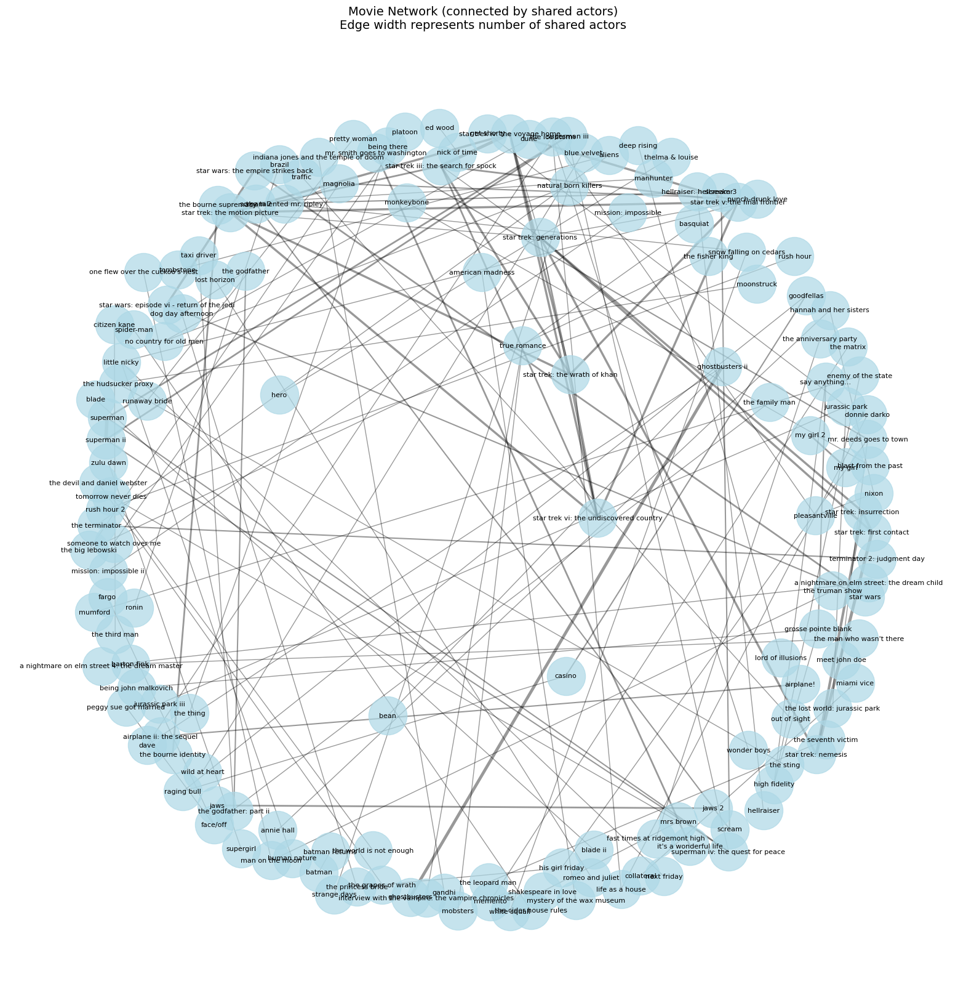

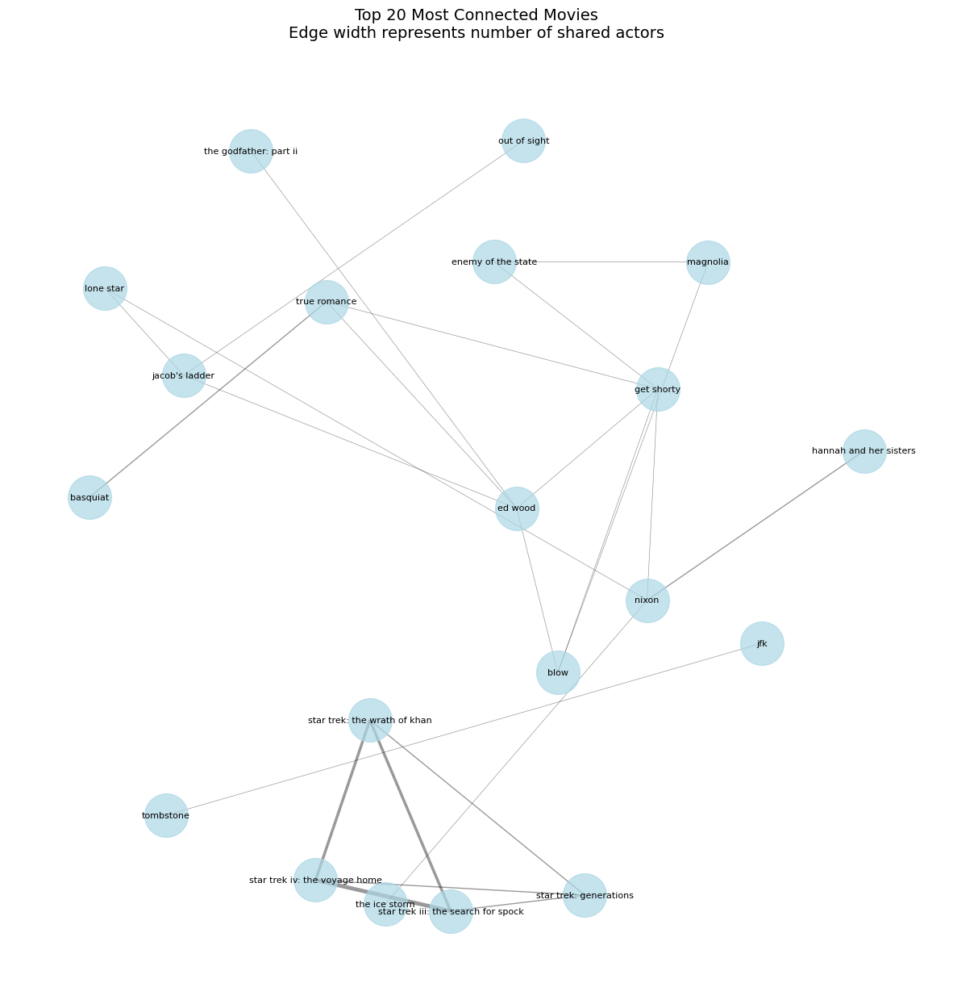

In [64]:
# Use either visualization
plt1 = plot_movie_network(cast_df, min_collaborations=2)
plt1.show()

# Or the alternative focusing on top movies
plt2 = plot_top_movie_network(cast_df, top_n=20)
plt2.show()

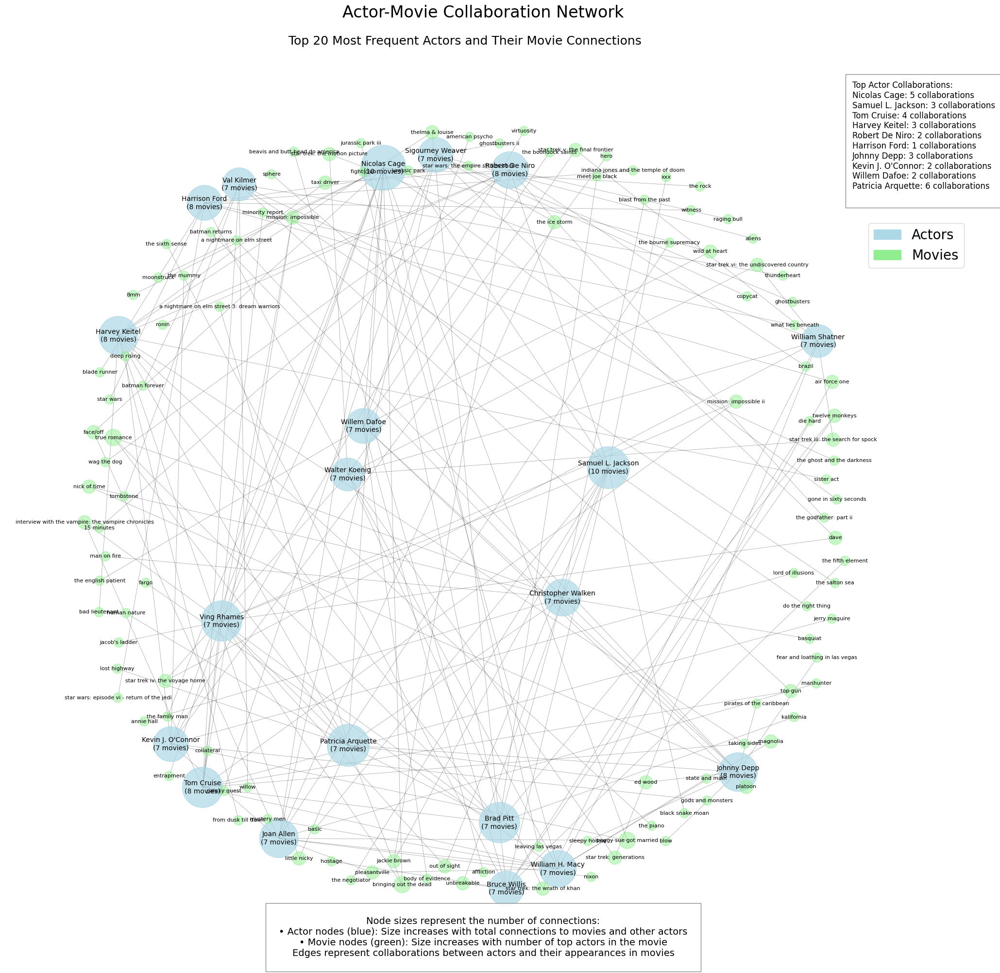

In [112]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import matplotlib.patches as mpatches

def plot_actor_network(cast_df, top_n=20):
    # Get top actors by number of movies and their movie counts
    actor_counts = cast_df['actor_name'].value_counts().head(top_n)
    top_actors = actor_counts.index.tolist()
    
    # Store top_actors as a global variable to ensure persistence
    global _top_actors
    _top_actors = top_actors
    
    # Create graph
    G = nx.Graph()
    
    # Get all movies these actors appeared in
    relevant_data = cast_df[cast_df['actor_name'].isin(_top_actors)]
    
    # Add nodes with movie counts
    for actor in _top_actors:
        G.add_node(actor, node_type='actor', movie_count=actor_counts[actor])
    
    # Add movie nodes and edges
    movie_degrees = defaultdict(int)
    for _, row in relevant_data.iterrows():
        movie = row['movie_title']
        actor = row['actor_name']
        
        if movie not in G:
            G.add_node(movie, node_type='movie')
        G.add_edge(actor, movie)
        movie_degrees[movie] += 1
    
    # Calculate actor collaborations
    actor_movies = defaultdict(set)
    for _, row in relevant_data.iterrows():
        actor_movies[row['actor_name']].add(row['movie_title'])
    
    # Add edges between actors who worked together
    for actor1 in _top_actors:
        for actor2 in _top_actors:
            if actor1 < actor2:
                shared_movies = len(actor_movies[actor1] & actor_movies[actor2])
                if shared_movies > 0:
                    G.add_edge(actor1, actor2, weight=shared_movies)
    
    # Store these for later use
    global _movie_degrees, _actor_counts
    _movie_degrees = movie_degrees
    _actor_counts = actor_counts
    
    # Create figure with more space
    plt.figure(figsize=(20, 20))
    plt.subplots_adjust(top=0.95, bottom=0.1, right=0.95, left=0.05)
    
    # Create layout
    pos = nx.spring_layout(G, k=2, iterations=50, seed=42)
    
    # Separate nodes by type
    actor_nodes = [node for node in G.nodes() if node in _top_actors]
    movie_nodes = [node for node in G.nodes() if node not in _top_actors]
    
    # Calculate node sizes
    actor_sizes = [G.degree(node) * 300 for node in actor_nodes]
    movie_sizes = [_movie_degrees[node] * 200 for node in movie_nodes]
    
    # Draw actor nodes (removed label parameter)
    nx.draw_networkx_nodes(G, pos, nodelist=actor_nodes, 
                           node_color='lightblue', 
                           node_size=actor_sizes, 
                           alpha=0.7)
    
    # Draw movie nodes (removed label parameter)
    nx.draw_networkx_nodes(G, pos, nodelist=movie_nodes, 
                           node_color='lightgreen', 
                           node_size=movie_sizes, 
                           alpha=0.5)
    
    # Draw edges
    nx.draw_networkx_edges(G, pos, alpha=0.4, width=0.5)
    
    # Create labels with movie counts
    actor_labels = {node: f"{node}\n({_actor_counts[node]} movies)" for node in actor_nodes}
    movie_labels = {node: node for node in movie_nodes}
    
    # Add labels
    nx.draw_networkx_labels(G, pos, actor_labels, font_size=10)
    nx.draw_networkx_labels(G, pos, movie_labels, font_size=8)
    
    # Create custom legend handles
    actor_patch = mpatches.Patch(color='lightblue', label='Actors')
    movie_patch = mpatches.Patch(color='lightgreen', label='Movies')
    
    # Add legend with custom handles
    plt.legend(handles=[actor_patch, movie_patch], fontsize=20, loc='upper right', bbox_to_anchor=(1.05, 0.82))
    
    # Add titles
    plt.suptitle("Actor-Movie Collaboration Network", 
                 fontsize=24, y=1)
    plt.title("Top 20 Most Frequent Actors and Their Movie Connections", 
              fontsize=18, pad=10)
    
    # Add collaboration counts
    collab_text = "Top Actor Collaborations:\n"
    for actor in _top_actors[:10]:
        collab_count = sum(1 for other in _top_actors 
                           if other != actor and G.has_edge(actor, other))
        collab_text += f"{actor}: {collab_count} collaborations\n"
    
    plt.figtext(0.88, 0.8, collab_text, 
                fontsize=12,
                bbox=dict(facecolor='white', alpha=0.9, 
                          edgecolor='gray', pad=10))
    
    # Add caption
    caption = (
        "Node sizes represent the number of connections:\n"
        "• Actor nodes (blue): Size increases with total connections to movies and other actors\n"
        "• Movie nodes (green): Size increases with number of top actors in the movie\n"
        "Edges represent collaborations between actors and their appearances in movies"
    )
    
    plt.figtext(0.5, 0.02, caption, 
                ha='center', 
                fontsize=14,
                bbox=dict(facecolor='white', alpha=0.9,
                          edgecolor='gray', pad=20))
    
    plt.axis('off')
    plt.tight_layout()
    return plt

# Initialize global variables
_top_actors = None
_movie_degrees = None
_actor_counts = None

# Create and show the network
plt = plot_actor_network(cast_df, top_n=20)
plt.show()



Network Statistics for min_collaborations=1:
Number of movies: 524
Number of connections: 2552
Average shared actors per connection: 1.09
Max shared actors on a connection: 8


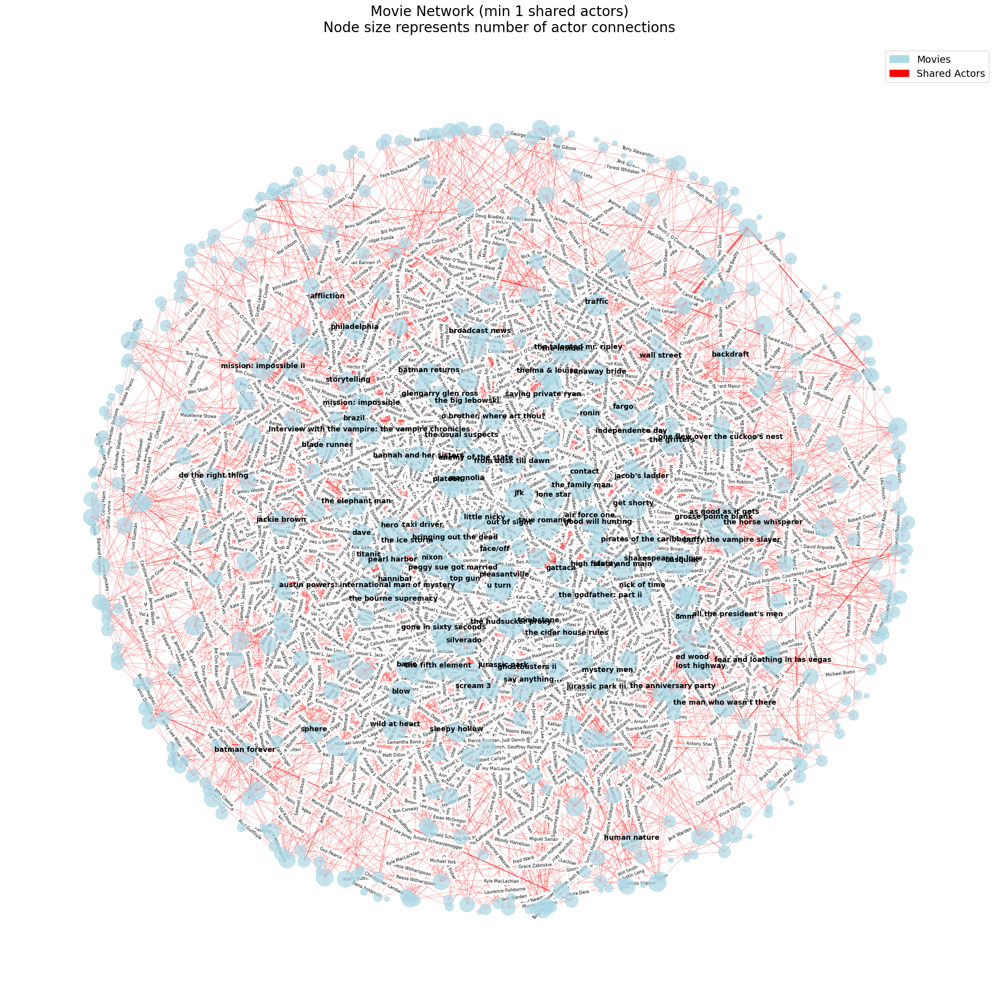


Network Statistics for min_collaborations=2:
Number of movies: 156
Number of connections: 132
Average shared actors per connection: 2.81
Max shared actors on a connection: 8


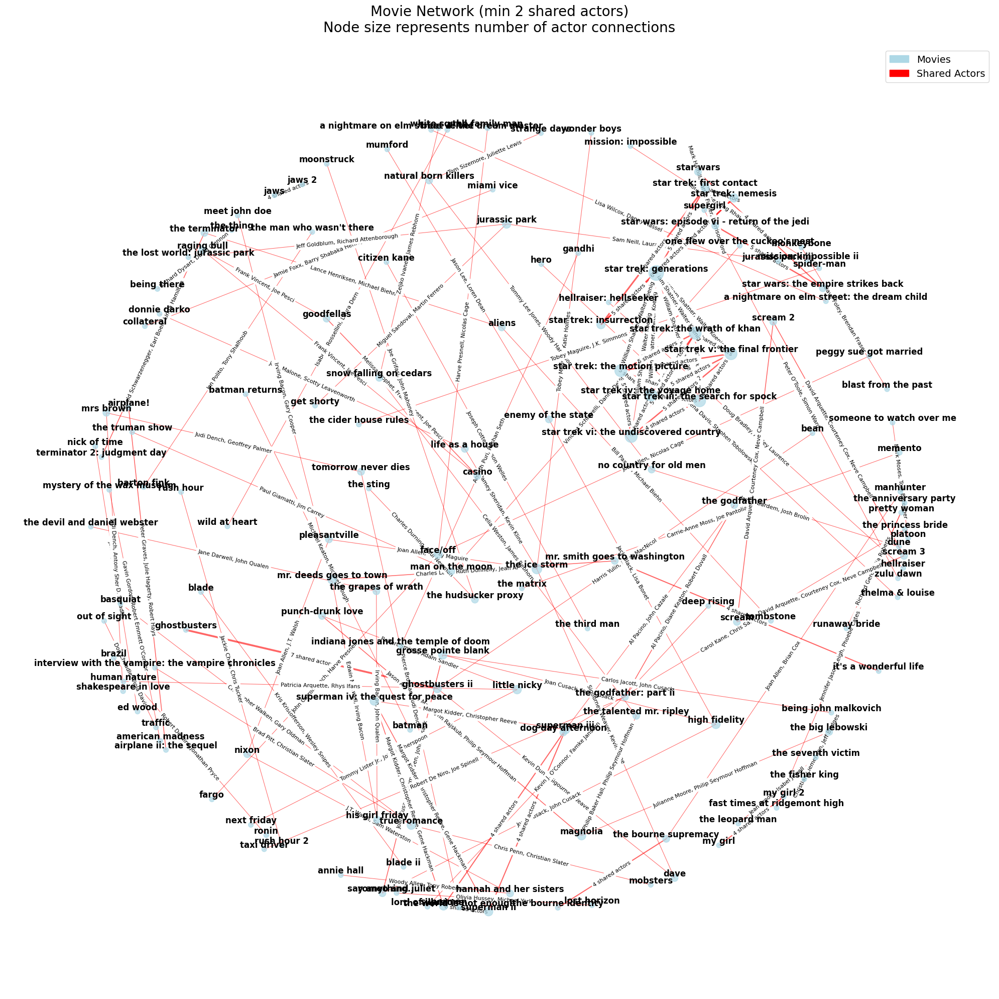


Network Statistics for min_collaborations=3:
Number of movies: 43
Number of connections: 44
Average shared actors per connection: 4.43
Max shared actors on a connection: 8


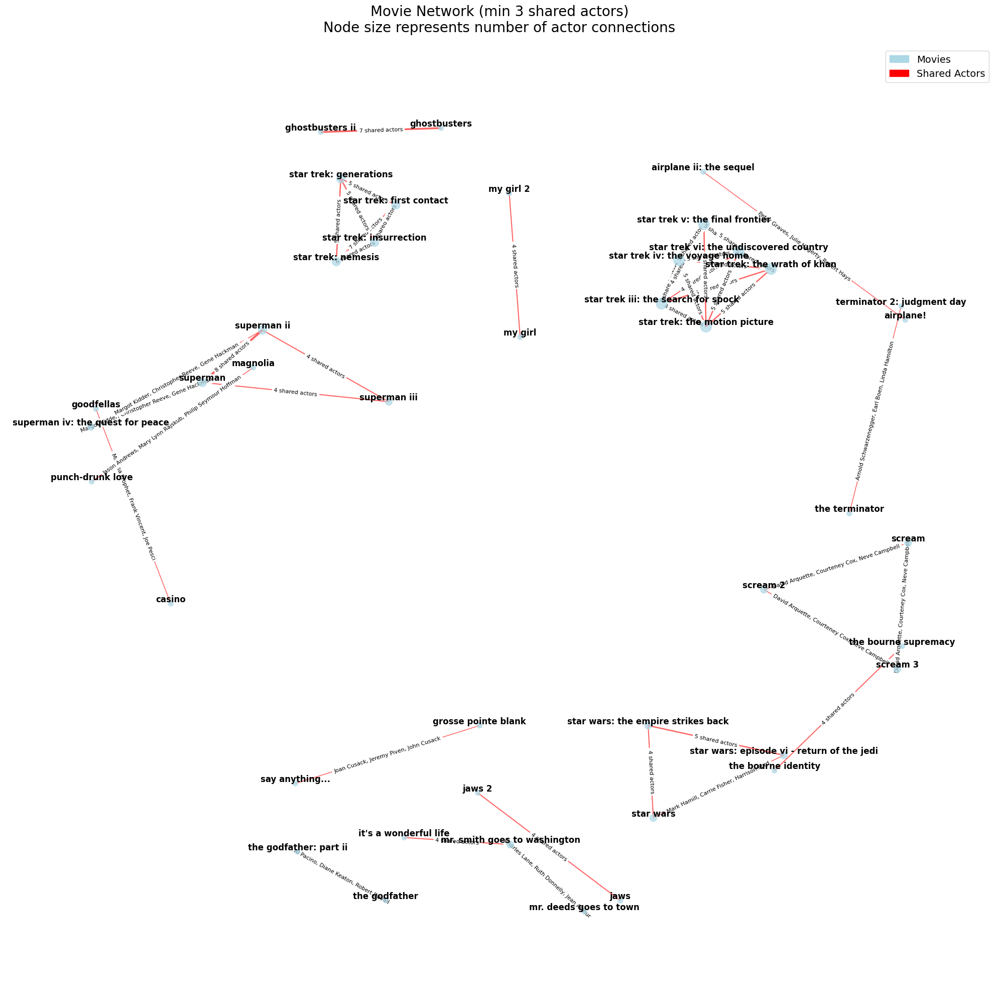

In [124]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_movie_network(cast_df, min_collaborations=3, top_n_movies=None):
    # Create movie-movie network
    G = nx.Graph()
    
    # Create dictionary of movies and their actors
    movie_actors = {}
    for movie in cast_df['movie_title'].unique():
        actors = set(cast_df[cast_df['movie_title'] == movie]['actor_name'])
        movie_actors[movie] = actors
    
    # Add edges between movies that share actors
    movies = list(movie_actors.keys())
    for i in range(len(movies)):
        for j in range(i+1, len(movies)):
            movie1, movie2 = movies[i], movies[j]
            shared_actors_set = movie_actors[movie1].intersection(movie_actors[movie2])
            shared_actors_count = len(shared_actors_set)
            if shared_actors_count >= min_collaborations:
                G.add_edge(
                    movie1, movie2, 
                    weight=shared_actors_count, 
                    shared_actors=shared_actors_set
                )
    
    # For min_collaborations=1, limit to top N movies
    if min_collaborations == 1 and top_n_movies is not None:
        # Calculate degrees of nodes
        degrees = dict(G.degree())
        # Sort nodes by degree in descending order
        sorted_nodes = sorted(degrees.items(), key=lambda x: x[1], reverse=True)
        # Get the top N movies
        top_movies = [node for node, degree in sorted_nodes[:top_n_movies]]
        # Create subgraph with top N movies
        G = G.subgraph(top_movies).copy()
    
    # Compute positions using spring layout
    pos = nx.spring_layout(G, k=3.0, iterations=200, seed=42)
    
    # Plot
    plt.figure(figsize=(20, 20))
    
    # Draw edges with red color underneath nodes
    edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
    if edge_weights:
        max_weight = max(edge_weights)
        edge_widths = [3 * w / max_weight for w in edge_weights]
    else:
        edge_widths = 1
    
    nx.draw_networkx_edges(
        G, pos,
        alpha=0.6,
        width=edge_widths,
        edge_color='red'
    )
    
    # Adjust node sizes based on actor connections (degree)
    degrees = dict(G.degree())
    node_sizes = [degrees[node] * 50 for node in G.nodes()]  # Adjust the multiplier as needed
    
    # Draw nodes
    nx.draw_networkx_nodes(
        G, pos,
        node_color='lightblue',
        node_size=node_sizes,
        alpha=0.7
    )
    
    # Prepare node labels
    if min_collaborations == 1:
        # Display labels for top 200 movies
        degrees = dict(G.degree())
        sorted_nodes = sorted(degrees.items(), key=lambda x: x[1], reverse=True)
        top_movies = [node for node, degree in sorted_nodes[:100]]
        node_labels = {node: node for node in top_movies}
        node_label_font_size = 10
    else:
        # Label all nodes for min_collaborations=2 and 3
        node_labels = {node: node for node in G.nodes()}
        node_label_font_size = 12
    
    # Add labels to nodes
    nx.draw_networkx_labels(
        G, pos,
        labels=node_labels,
        font_size=node_label_font_size,
        font_weight='bold',
        verticalalignment='bottom'
    )
    
    # Prepare edge labels with shared actors
    edge_labels = {}
    for u, v, data in G.edges(data=True):
        shared_actors = data['shared_actors']
        if len(shared_actors) <= 3:
            label = ', '.join(shared_actors)
        else:
            label = f"{len(shared_actors)} shared actors"
        edge_labels[(u, v)] = label
    
    # For min_collaborations=1, you may choose to reduce edge labels if too cluttered
    if min_collaborations == 1:
        edge_label_font_size = 6
    else:
        edge_label_font_size = 8
    
    # Draw edge labels
    nx.draw_networkx_edge_labels(
        G, pos, 
        edge_labels=edge_labels, 
        font_size=edge_label_font_size
    )
    
    # Add legend
    # Create custom legend handles
    node_patch = mpatches.Patch(color='lightblue', label='Movies')
    edge_line = mpatches.Patch(color='red', label='Shared Actors')
    plt.legend(handles=[node_patch, edge_line], fontsize=14, loc='upper right')
    
    plt.title(
        f"Movie Network (min {min_collaborations} shared actors)\nNode size represents number of actor connections",
        pad=20, fontsize=20
    )
    plt.axis('off')
    plt.tight_layout()
    
    # Print network statistics
    print(f"\nNetwork Statistics for min_collaborations={min_collaborations}:")
    print(f"Number of movies: {len(G.nodes())}")
    print(f"Number of connections: {len(G.edges())}")
    if edge_weights:
        print(f"Average shared actors per connection: {np.mean(edge_weights):.2f}")
        print(f"Max shared actors on a connection: {max_weight}")
    
    return plt

# Generate and show the networks for min_collaborations=1, 2, and 3
for min_collab in [1, 2, 3]:
    if min_collab == 1:
        plt = plot_movie_network(cast_df, min_collaborations=min_collab, top_n_movies=None)
    else:
        plt = plot_movie_network(cast_df, min_collaborations=min_collab)
    plt.show()
